# Artistic Image Filters Using OpenCV

This notebook will demonstrate various image manipulation techniques using OpenCV to mimic popular photoshop or instagram filters. In this notebook we will experiment with a wide range of filters, many of which produce artistic renderings of the original image. As you will see in the notebook, many of these effects require some experimentation, and the result for a given filter can vary quite a bit depending on the particular image used.
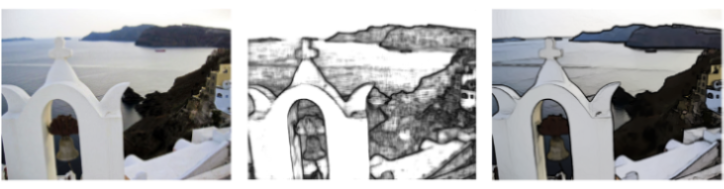

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
flower = cv2.imread("../00-module8/flowers.jpg")
house = cv2.imread("../00-module8/house.jpg")
monument = cv2.imread("../00-module8/monument.jpg")
santorini = cv2.imread("../00-module8/santorini.jpg")
new_york = cv2.imread("../00-module8/new-york.jpg")
coast = cv2.imread("../00-module8/california-coast.jpg")

In [3]:
# Function to displasy original and filtered images
def plot(img1, img2):
    fig = plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title("Original Image")
    
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title("Filtered Image")
    
    plt.show()

## Black and White

The first example is a simple black and white filter.

In [4]:
def bw_filter(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img_gray 

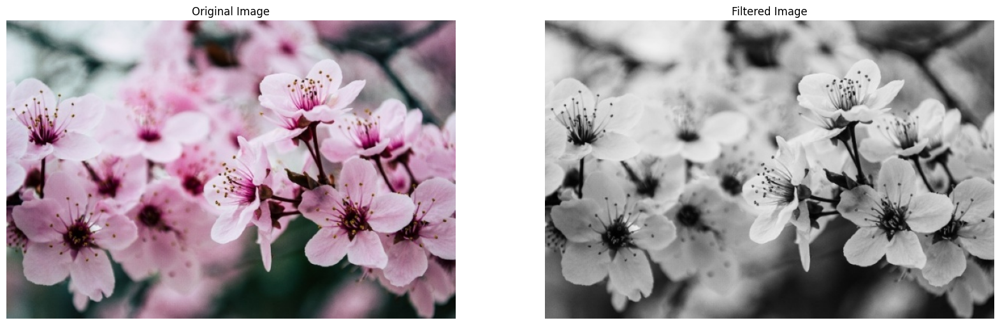

In [5]:
img = flower
img_bw = bw_filter(img)
plot(img, img_bw)

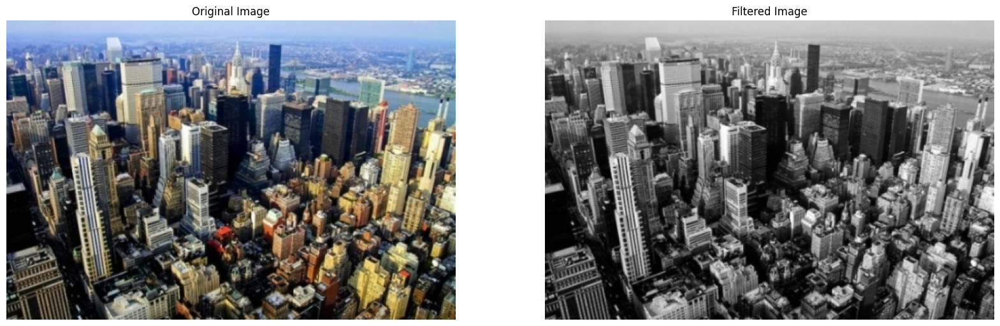

In [6]:
img = new_york
img_bw = bw_filter(img)
plot(img, img_bw)

## Sepia / Vintage Filter

### Matrix Transformation
`transform()` performs the matrix transformation of every array element.

---

#### Function Syntax

dst = cv2.transform(src, m[, dst])

`dst`: output array of the same size and depth as src.

The function has __2 required input arguments__:

1. `src`: input array.
2. `m`: trtansformation 2x2 or 2x3 floating-point matrix.

---

transforming a color photograph into a vintage sepia toned image amounts to performing a color transformation. For this purpose, we use a transformation function in OpenCV which allows us to modify the color space of the original image by multiplying each pixel in the image with by a color transformation matrix.

In [7]:
def sepia(img):
    img_sepia = img.copy()
    # Converting to RGB as sepia matrix below is for RGB.
    img_sepia = cv2.cvtColor(img_sepia, cv2.COLOR_BGR2RGB)
    img_sepia = np.array(img_sepia, dtype=np.float64)
    img_sepia = cv2.transform(img_sepia, np.matrix(
        [[0.393, 0.769, 0.189],
         [0.394, 0.686, 0.168],
         [0.272, 0.534, 0.131]]
    ))
    # Clip values to the range [0, 255].
    img_sepia = np.clip(img_sepia, 0, 255)
    img_sepia = np.array(img_sepia, dtype=np.uint8)
    img_sepia = cv2.cvtColor(img_sepia, cv2.COLOR_RGB2BGR)
    return img_sepia

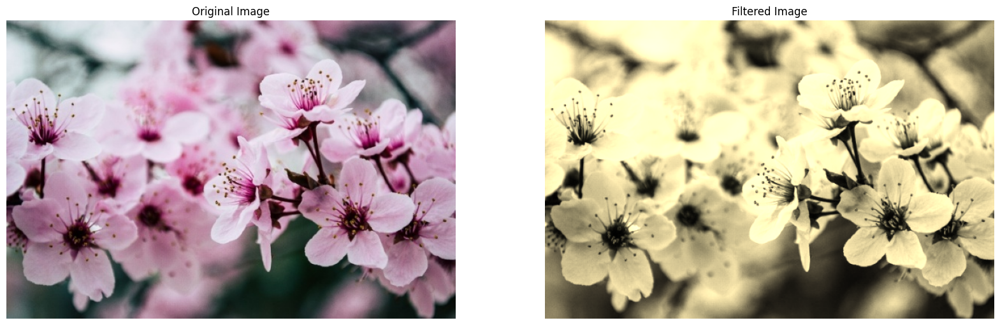

In [8]:
img = flower
img_sepia = sepia(img)
plot(img, img_sepia)

##  Vignette Effect

The vignette effect is achieved by creating a broad 2D Gaussian kernel.

---

#### Function Syntax

retval = cv2.getGaussianKernel(ksize, sigma[, ktype])

Thefunction has __2required argumentes__:

1. `ksize`: Aperture size. It should be odd (`ksize mod 2 = 1`) and positive.
2. `sigma`: Gaussian standard deviation. If it is non-positive, it is computed from ksize as `sigma = 0.3 * ((ksize - 1) * 0.5 -1) + 0.8`

In [9]:
def vignette(img, level=2):
    height, width = img.shape[:2]
    
    # Generate a vignette mask using Gaussian kernels.
    x_resultant_kernel = cv2.getGaussianKernel(width, width/level)
    y_resultant_kernel = cv2.getGaussianKernel(height, height/level)
    
    # Generating resultant_kernel matrix
    kernel = y_resultant_kernel * x_resultant_kernel.T
    mask = kernel / kernel.max()
    
    img_vignette = np.copy(img)
    
    # Applying the mask to each channel in the input image.
    for i in range(3):
        img_vignette[:, :, i] = img_vignette[:, :, i] * mask
    return img_vignette

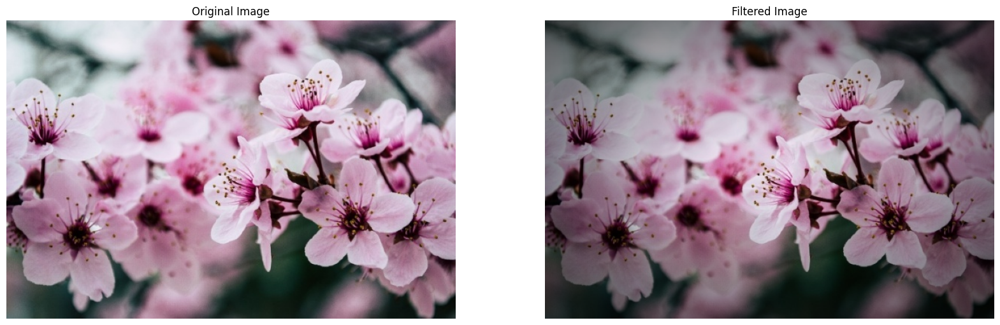

In [10]:
img = flower
img_vignette = vignette(img)
plot(img, img_vignette)

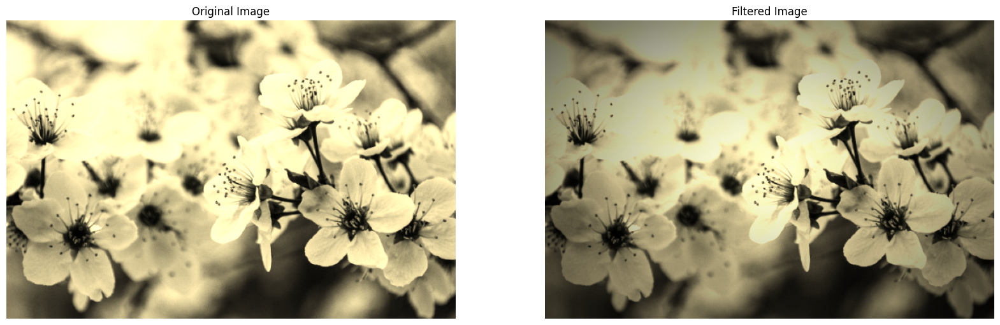

In [11]:
img = img_sepia
img_vignette = vignette(img)
plot(img, img_vignette)

## Edge Detection Filter

`cv2.Canny()`

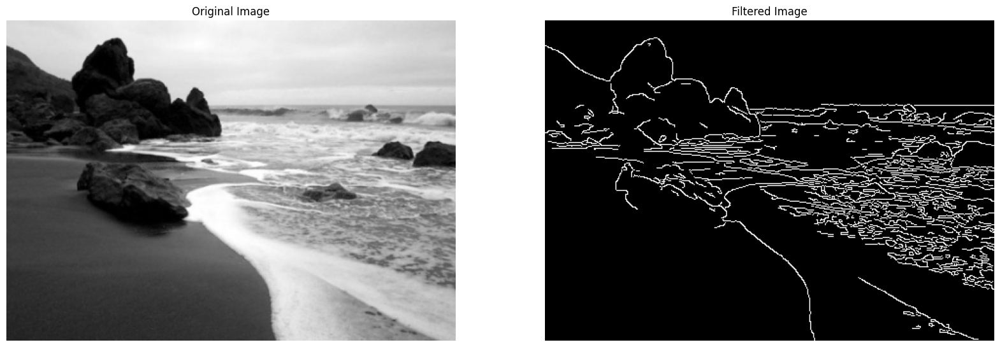

In [12]:
img = coast
img_edges = cv2.Canny(img, 100, 200)
plot(img, img_edges)

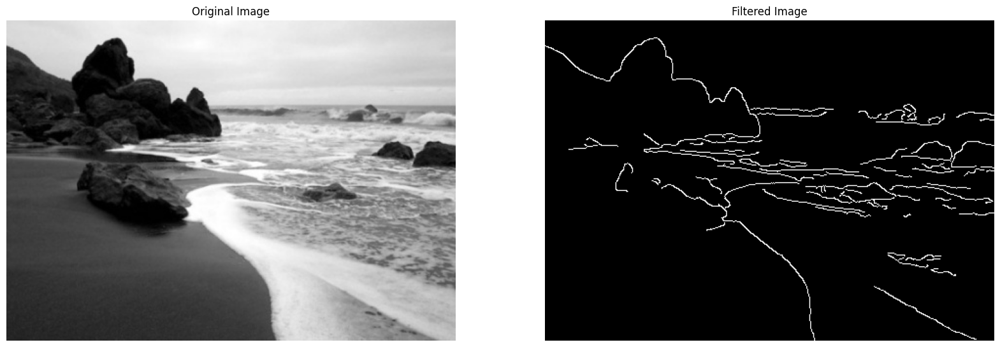

In [13]:
img = coast
img_blur = cv2.GaussianBlur(img, (5, 5), 0, 0)
img_edges = cv2.Canny(img_blur, 100, 200)
plot(img, img_edges)

## Embossed Edges

### Convolving Images with a Kernel
`filter2D()` convolves an image with the kernel. The function applies an arbitrary linear filter to an image.

---

This has the effect of creating edges that have sort of a 3D effect.

Oftentimes the particular content of an image will have a significant impact on what the results look like, so it's not uncommon that you would have to experiment quite a bit with different types of filter to achieve a particular effect.

In [16]:
def embossed_edges(img):
    kernel = np.array(
        [
            [0, -3, -3],
            [3, 0, -3],
            [3, 3, 0]
        ]
    )
    img_emboss = cv2.filter2D(img, -1, kernel=kernel)
    return img_emboss

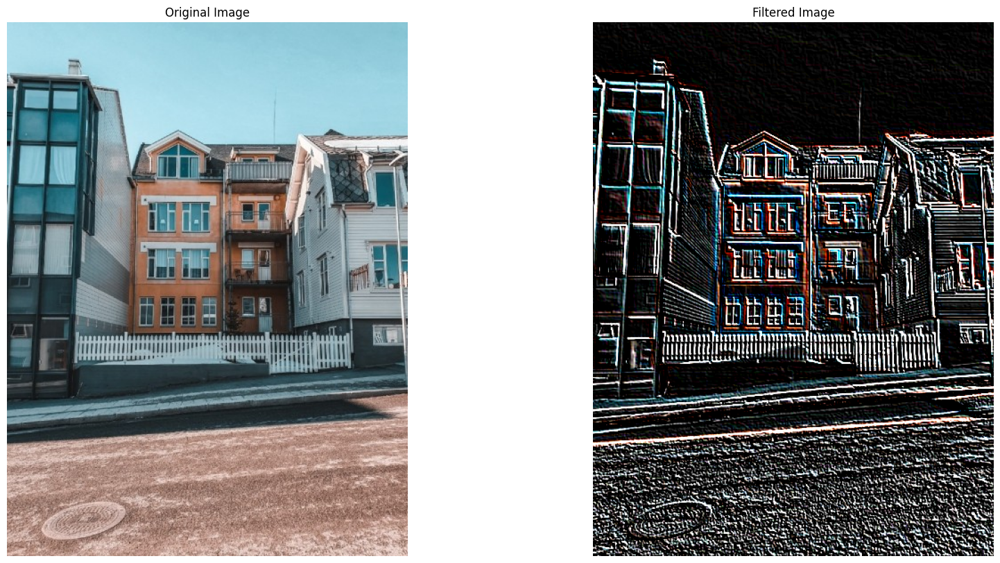

In [17]:
img = house
img_emboss = embossed_edges(img)
plot(img, img_emboss)

## Improving Exposure

`convertScaleAbs()` scales, calculates absolute values, and converts the result to 8-bit.

In [18]:
def bright(img, level):
    img_bright = cv2.convertScaleAbs(img, beta=level)
    return img_bright

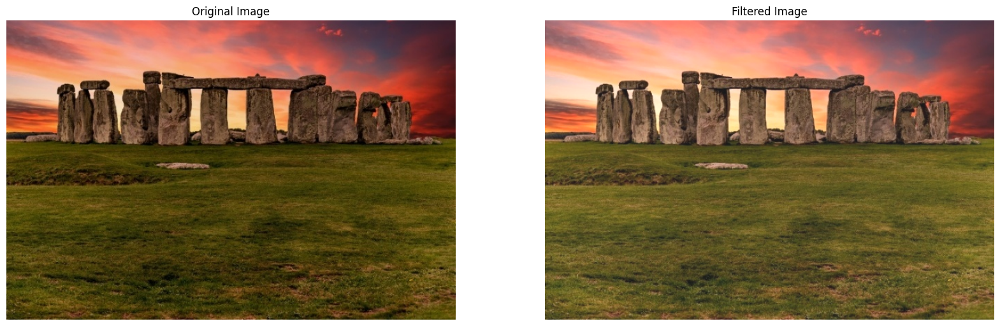

In [19]:
img = monument
img_bright = bright(img, 25)
plot(img, img_bright)

## Outline Filter

In [20]:
def outline(img, k=9):
    k = max(k, 9)
    kernel = np.array(
        [
            [-1, -1, -1],
            [-1, k, -1],
            [-1, -1, -1]
        ]
    )
    img_outline = cv2.filter2D(img, ddepth=-1, kernel=kernel)
    return img_outline

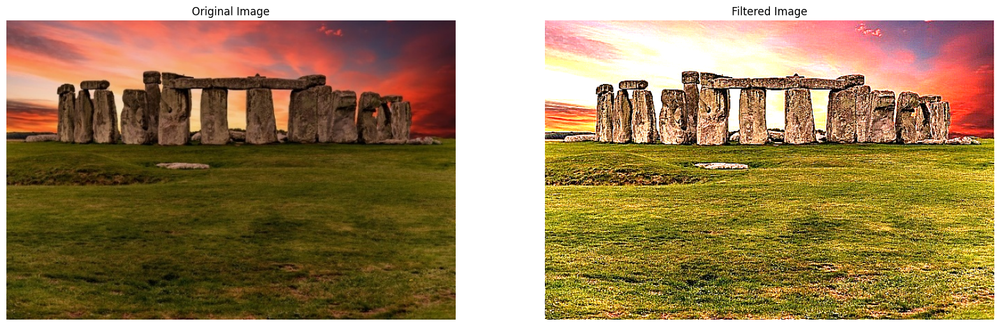

In [21]:
img = monument
img_outline = outline(img, k=10)
plot(img, img_outline)

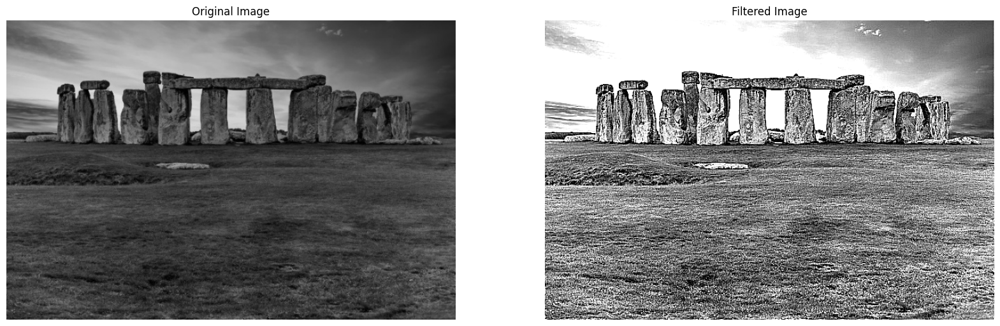

In [22]:
img = monument
img = bw_filter(img)
img_outline = outline(img, k=10)
plot(img, img_outline)

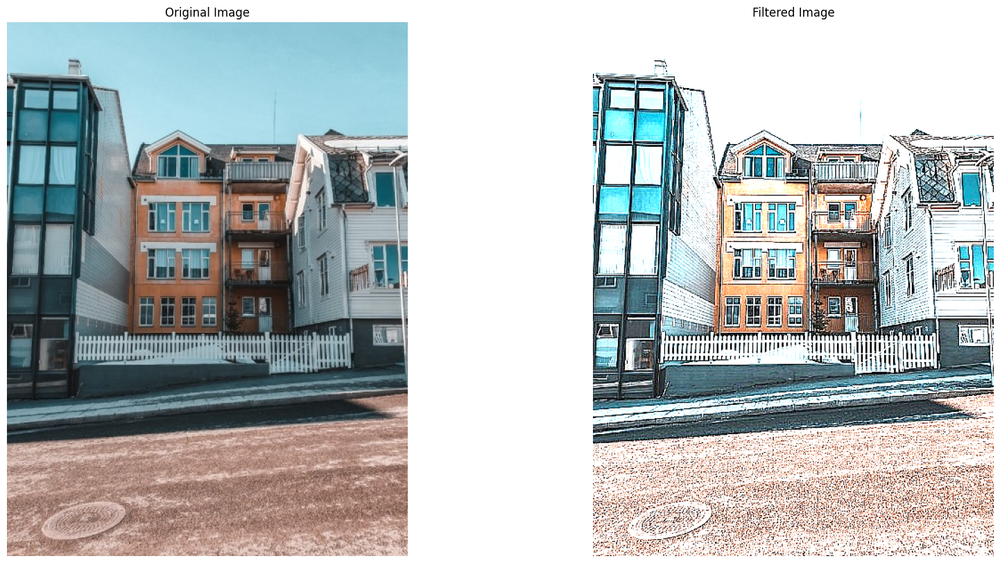

In [23]:
img = house
img_outline = outline(img, k=10)
plot(img, img_outline)

The next two filters were were specifically engineered in OpnenCV to produce artistic results referred to as the pencil sketch and stylization filters saving the best for last.

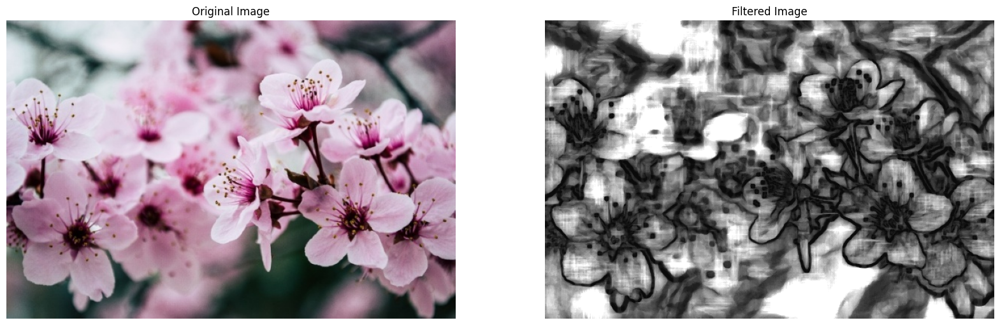

In [26]:
# Blurringis often recommended as a pre-processing step to smooth detail in the image
# and results in a solter and often more pleasing pencil sketch.
img = flower
img_blur = cv2.GaussianBlur(img, (5, 5), 0, 0)
img_sketch_bw, _ = cv2.pencilSketch(img_blur)
plot(img, img_sketch_bw)

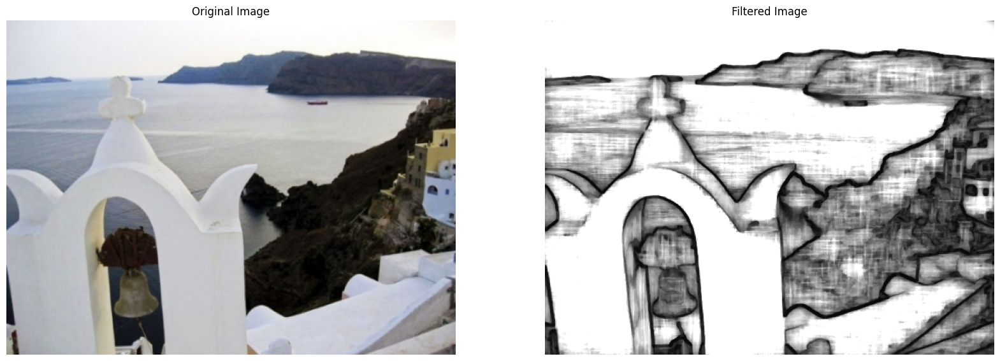

In [27]:
img = santorini
img_blur = cv2.GaussianBlur(img, (5, 5), 0, 0)
img_sketch_bw, img_sketch_color = cv2.pencilSketch(img_blur)
plot(img, img_sketch_bw)

### Stylization Filter

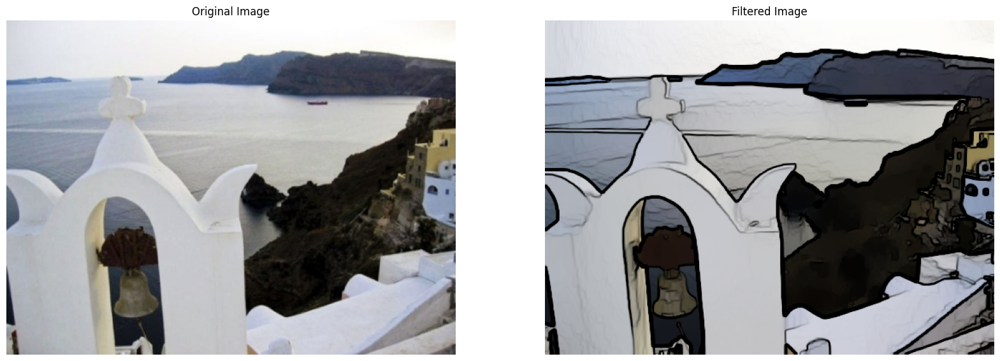

In [28]:
img = santorini
img_blur = cv2.GaussianBlur(img, (5, 5), 0, 0)
img_style = cv2.stylization(img_blur, sigma_s=40, sigma_r=.1)
plot(img, img_style)